# Movie Rating Distributions

#### Grading:


- Code: 90 pts
- Markdown Documentation: 10 pts


In this assignment we are going understand distributions

In [41]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from IPython.display import HTML, display
import plotly.express as px

pd.set_option('display.notebook_repr_html', False)
pd.set_option('display.max_columns', 20)
pd.set_option('display.max_rows', 25)

In [42]:
%matplotlib inline

##### Read in the movie data: `pd.read_table`

In [43]:
def get_movie_data():
    
    unames = ['user_id','gender','age','occupation','zip']
    users = pd.read_table(os.path.join('../data','users.dat'), 
                          sep='::', header=None, names=unames, encoding='latin-1')
    
    rnames = ['user_id', 'movie_id', 'rating', 'timestamp']
    ratings = pd.read_table(os.path.join('../data', 'ratings.dat'), 
                            sep='::', header=None, names=rnames, encoding='latin-1')
    
    mnames = ['movie_id', 'title','genres']
    movies = pd.read_table(os.path.join('../data', 'movies.dat'), 
                           sep='::', header=None, names=mnames, encoding='latin-1')

    return users, ratings, movies

In [44]:
users, ratings, movies = get_movie_data()

/Users/vijaykrishna/opt/anaconda3/lib/python3.9/site-packages/pandas/util/_decorators.py:311: ParserWarning:

Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.



In [45]:
print(users.head())

   user_id gender  age  occupation    zip
0        1      F    1          10  48067
1        2      M   56          16  70072
2        3      M   25          15  55117
3        4      M   45           7  02460
4        5      M   25          20  55455


In [46]:
print(ratings.head())

   user_id  movie_id  rating  timestamp
0        1      1193       5  978300760
1        1       661       3  978302109
2        1       914       3  978301968
3        1      3408       4  978300275
4        1      2355       5  978824291


In [47]:
print(movies.head())

   movie_id                               title                        genres
0         1                    Toy Story (1995)   Animation|Children's|Comedy
1         2                      Jumanji (1995)  Adventure|Children's|Fantasy
2         3             Grumpier Old Men (1995)                Comedy|Romance
3         4            Waiting to Exhale (1995)                  Comedy|Drama
4         5  Father of the Bride Part II (1995)                        Comedy


##### Clean up the `movies`

- Get the `year`
- Shorten the `title`


In [48]:
tmp = movies.title.str.extract('(.*) \(([0-9]+)\)')
tmp.apply(lambda x:x[0] if len(x) > 0 else None)
tmp.apply(lambda x: x[0][:40] if len(x) > 0 else None)

0    Toy Story
1         1995
dtype: object

In [49]:
movies['year'] = tmp[1]
movies['short_title'] = tmp[0]

In [50]:
print(movies.head())

   movie_id                               title                        genres  \
0         1                    Toy Story (1995)   Animation|Children's|Comedy   
1         2                      Jumanji (1995)  Adventure|Children's|Fantasy   
2         3             Grumpier Old Men (1995)                Comedy|Romance   
3         4            Waiting to Exhale (1995)                  Comedy|Drama   
4         5  Father of the Bride Part II (1995)                        Comedy   

   year                  short_title  
0  1995                    Toy Story  
1  1995                      Jumanji  
2  1995             Grumpier Old Men  
3  1995            Waiting to Exhale  
4  1995  Father of the Bride Part II  


### 1. What is the overal distribution of ratings (20 pts)

- Describe the distribution and its properties

In [51]:
ratings_users = pd.merge(users,ratings, left_on='user_id', right_on='user_id')
ratings_users_movies = pd.merge(movies,ratings_users, left_on='movie_id' , right_on = 'movie_id')

ratings_users_movies

         movie_id                  title                       genres  year  \
0               1       Toy Story (1995)  Animation|Children's|Comedy  1995   
1               1       Toy Story (1995)  Animation|Children's|Comedy  1995   
2               1       Toy Story (1995)  Animation|Children's|Comedy  1995   
3               1       Toy Story (1995)  Animation|Children's|Comedy  1995   
4               1       Toy Story (1995)  Animation|Children's|Comedy  1995   
...           ...                    ...                          ...   ...   
1000204      3952  Contender, The (2000)               Drama|Thriller  2000   
1000205      3952  Contender, The (2000)               Drama|Thriller  2000   
1000206      3952  Contender, The (2000)               Drama|Thriller  2000   
1000207      3952  Contender, The (2000)               Drama|Thriller  2000   
1000208      3952  Contender, The (2000)               Drama|Thriller  2000   

            short_title  user_id gender  age  occup

array([[<AxesSubplot:title={'center':'movie_id'}>,
        <AxesSubplot:title={'center':'user_id'}>],
       [<AxesSubplot:title={'center':'age'}>,
        <AxesSubplot:title={'center':'occupation'}>],
       [<AxesSubplot:title={'center':'rating'}>,
        <AxesSubplot:title={'center':'timestamp'}>]], dtype=object)

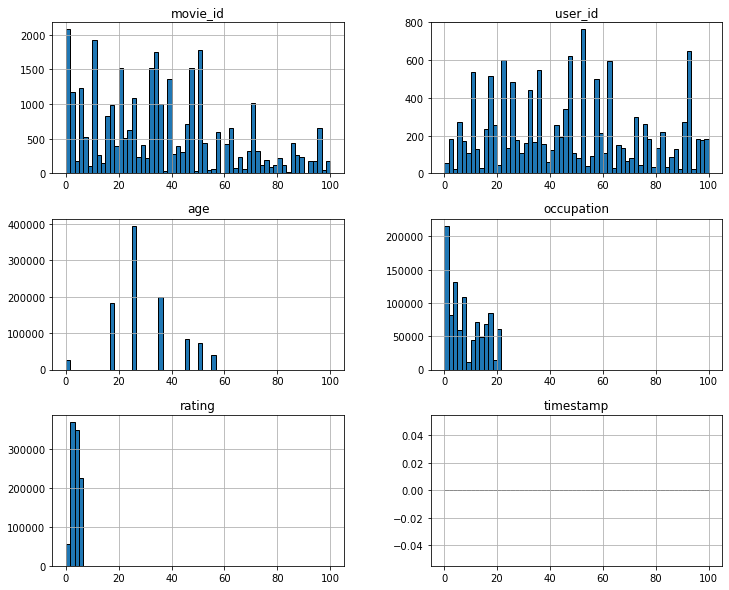

In [52]:
pd.DataFrame(ratings_users_movies).hist(bins=60,
                                  range=(0, 100),
                                  figsize=(12,10), ec='black')

#print( stats.skew(ratings_users_movies) )

In [53]:
fig = px.histogram(ratings_users_movies, x="rating", nbins=50, title='Ratings in the movies Dataset')
fig.show()



Mean

In [54]:
ratings_users_movies.rating.mean()

3.581564453029317

Median

In [55]:
ratings_users_movies.rating.median()

4.0

5 number summary

The five-number summary would be as follows:

1. Minimum

2. Lower Quartile (Q1)

3. Median (Q2)

4. Upper Quartile (Q3)

5. Maximum

In [56]:
q1 = ratings_users_movies.rating.quantile(q=0.25, interpolation='linear')

print('Lower Quartile (Q1) of ratings is :', q1)


Lower Quartile (Q1) of ratings is : 3.0


In [57]:
# maximum value
max_value =ratings_users_movies['rating'].max()
print('Max Value of the ratings is :', max_value)

Max Value of the ratings is : 5


In [58]:
min_value =ratings_users_movies['rating'].min()
print('Min Value of ratings is :', min_value)

Min Value of ratings is : 1


In [59]:
q3 = ratings_users_movies.rating.quantile(q=0.75, interpolation='linear')
print('Upper Quartile (Q3) of ratings is :', q3)

Upper Quartile (Q3) of ratings is : 4.0


In [60]:
q2 = ratings_users_movies.rating.median()

print('Median (Q2) is :', q2)

Median (Q2) is : 4.0


Skew

In [61]:
ratings_users_movies.rating.skew()


-0.5536098874940051

Kurtoisis

In [62]:
ratings_users_movies.rating.kurt()


-0.35197080314042184

Describe the type distribution and why?

### 2. What's the distribution of average ratings of movies in action vs drama genres? (20 pts))

In [65]:
drama = ratings_users_movies.loc[ratings_users_movies['genres'] == 'Drama']
drama


        movie_id                    title genres  year       short_title  \
7470          14             Nixon (1995)  Drama  1995             Nixon   
7471          14             Nixon (1995)  Drama  1995             Nixon   
7472          14             Nixon (1995)  Drama  1995             Nixon   
7473          14             Nixon (1995)  Drama  1995             Nixon   
7474          14             Nixon (1995)  Drama  1995             Nixon   
...          ...                      ...    ...   ...               ...   
999816      3951  Two Family House (2000)  Drama  2000  Two Family House   
999817      3951  Two Family House (2000)  Drama  2000  Two Family House   
999818      3951  Two Family House (2000)  Drama  2000  Two Family House   
999819      3951  Two Family House (2000)  Drama  2000  Two Family House   
999820      3951  Two Family House (2000)  Drama  2000  Two Family House   

        user_id gender  age  occupation    zip  rating   timestamp  
7470          8   

In [71]:
fig = px.histogram(drama, x = 'rating', nbins = 100, title = '')


mean_drama_rating=drama['rating'].mean()
median_drama_rating=drama['rating'].median()

fig.add_vline(x= mean_drama_rating,line_color='red', annotation_text='mean', annotation_position='bottom')
fig.add_vline(x=median_drama_rating, annotation_text='median', annotation_position='top')

fig.show()

In [66]:
action = ratings_users_movies.loc[ratings_users_movies['genres'] == 'Action']
action

        movie_id                   title  genres  year      short_title  \
5188           9     Sudden Death (1995)  Action  1995     Sudden Death   
5189           9     Sudden Death (1995)  Action  1995     Sudden Death   
5190           9     Sudden Death (1995)  Action  1995     Sudden Death   
5191           9     Sudden Death (1995)  Action  1995     Sudden Death   
5192           9     Sudden Death (1995)  Action  1995     Sudden Death   
...          ...                     ...     ...   ...              ...   
991111      3879  Art of War, The (2000)  Action  2000  Art of War, The   
991112      3879  Art of War, The (2000)  Action  2000  Art of War, The   
991113      3879  Art of War, The (2000)  Action  2000  Art of War, The   
991114      3879  Art of War, The (2000)  Action  2000  Art of War, The   
991115      3879  Art of War, The (2000)  Action  2000  Art of War, The   

        user_id gender  age  occupation         zip  rating   timestamp  
5188         65      M   

### 3. Develop distribution estimators for the action vs drama genres?? (60 pts)

- Create MoM, MLE, and KDE estimates for each category 
- Compare between them to see what the differences are
- Describe the results

#### Method of Moments

##### Drama

Plot the histogram distribution along with the estimator as shown in class.

##### Action

#### Maximum Likelihood

##### Drama

##### Action

#### KDE

##### Drama

##### Action